## Yandex Cloud

Облако Yandex Cloud содержит множество сервисов для выполнения базовых операций. Ниже мы приведём несколько "строительных блоков" в виде кусочков кода на Python, которые вы сможете использовать в своих проектах, например:

* Распознавание текста на картинке
* Рисование картинки по текстовому запросу с Yandex ART
* Работа с языковыми моделями в облаке, чтобы переделать текст:
   - сделать его более вежливым
   - получить краткое содержание текста
   - перевести его на другой язык
   - проверить работу студента
* распознать звук (речь) в текст
* синтезировать речь

Для начала получим файл с секретными ключами для доступа в облако (ключи будут доступны на время интенсива и работы над проектами):

In [1]:
!wget https://storage.yandexcloud.net/ycpub/keys/.env

--2025-09-29 10:41:21--  https://storage.yandexcloud.net/ycpub/keys/.env
Resolving storage.yandexcloud.net (storage.yandexcloud.net)... 213.180.193.243, 2a02:6b8::1d9
Connecting to storage.yandexcloud.net (storage.yandexcloud.net)|213.180.193.243|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 80 [application/x-www-form-urlencoded]
Saving to: '.env'

     0K                                                       100% 26,3M=0s

2025-09-29 10:41:23 (26,3 MB/s) - '.env' saved [80/80]



Также скачаем ещё полезные файлы, который нам пригодятся дальше по ходу демонстрации:

In [2]:
!wget https://github.com/yandex-datasphere/jacademy/blob/main/2024/images/slide.jpg?raw=true -O slide.jpg

--2025-09-29 10:41:56--  https://github.com/yandex-datasphere/jacademy/blob/main/2024/images/slide.jpg?raw=true
Resolving github.com (github.com)... 4.208.26.197
Connecting to github.com (github.com)|4.208.26.197|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/yandex-datasphere/jacademy/raw/refs/heads/main/2024/images/slide.jpg [following]
--2025-09-29 10:41:58--  https://github.com/yandex-datasphere/jacademy/raw/refs/heads/main/2024/images/slide.jpg
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/yandex-datasphere/jacademy/refs/heads/main/2024/images/slide.jpg [following]
--2025-09-29 10:41:58--  https://raw.githubusercontent.com/yandex-datasphere/jacademy/refs/heads/main/2024/images/slide.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercon

### Устанавливаем необходимые библиотеки

Для начала надо установить необходимые библиотеки Python, которые понадобятся нам в работе.

In [ ]:
%pip install dotenv yandex_cloud_ml_sdk yandex-speechkit==1.5.0 openai shwarsutils

Defaulting to user installation because normal site-packages is not writeable
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.7/56.7 MB 55.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 973.5/973.5 kB 28.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 48.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.0/11.0 MB 40.3 MB/s eta 0:00:0000:01
  Created wheel for yandex_chain: filename=yandex_chain-0.0.9-py3-none-any.whl size=9381 sha256=aa0a91128e907eaefed56d74fd8da5b79e4ae0e98d5e884ab88ff5431b8f6c2d
  Stored in directory: /tmp/xdg_cache/pip/wheels/80/a7/88/f2d8ee42bb6c5d4e1d410f716c1939862c56f1dfc9599dd0ff
Successfully built yandex_chain
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider addin

> **ВНИМАНИЕ!!!** После установки библиотек рекомендуется зайти в пункт меню **Kernel** -> **Restart Kernel**.

Теперь получаем секретные ключи для работы с облаком из ранее скачанного файла:

In [3]:
from dotenv import load_dotenv
import os
load_dotenv()

folder_id  = os.environ['folder_id']
api_key = os.environ['api_key']


### Использование больших языковых моделей

Большие языковые модели позволяют вам совершать различные манипуляции с текстом. Основное, что может модель - это отвечать на ваши вопросы. Соответственно, формулируя вопросы по-разному, вы можете попросить модель придумать что-то, перевести текст, перефразировать его в более короткой или более вежливой форме, и многое другое.

Для работы с моделью создадим объект `gpt`:

In [4]:
from openai import OpenAI
from IPython.display import Markdown, display

# Выбираем модель, которую хотим использовать
#model = f"gpt://{folder_id}/yandexgpt/rc"
#model = f"gpt://{folder_id}/gemma-3-27b-it/latest"
#model = f"gpt://{folder_id}/gpt-oss-120b/latest"
model = f"gpt://{folder_id}/qwen3-235b-a22b-fp8/latest"

client = OpenAI(
    base_url="https://rest-assistant.api.cloud.yandex.net/v1",
    api_key=api_key,
    project=folder_id
)

def printx(string):
    display(Markdown(string))

def gpt(x, model=model):
    res = client.responses.create(
        model = model,
        input = x)
    return res.output_text

printx(gpt('Привет! Придумай 10 новых слов для приветствия.'))

Привет! Вот 10 оригинальных и дружелюбных слов для приветствия — лёгких, звучных и с позитивной энергетикой:

1. **Здравито!** — от "здравствуйте", но короче и игривее.  
2. **Приветуль!** — уменьшительно-ласкательное от "привет", как утреннее обнимашное.  
3. **Сияй!** — приветствие, вдохновлённое светом и улыбкой.  
4. **Лучик!** — не слово-приветствие, а само приветствие: "Лучик!" — и сразу тепло.  
5. **Хайло!** — современно, с оттенком дружеского хай-тек настроения.  
6. **Радуй!** — как напоминание: "Рад встрече!" — сокращённо и тепло.  
7. **Витайо!** — от "встреча" и "привет", с лёгким иностранным оттенком.  
8. **Смайлун!** — для тех, кто любит улыбаться. Звучит как привет от солнечного существа.  
9. **Эйхо!** — энергичное, как звук эха от радостного возгласа.  
10. **Здоровося!** — смесь "здрасте" и "всё здорово", с позитивным зарядом.

Можно использовать в неформальной переписке, в играх, в дружеском кругу — чтобы подчеркнуть настроение и индивидуальность. 😊  
А какое тебе нравится больше всего?

Используем модель для преобразования текста в вежливую подробную форму:

In [ ]:
texts = [
    "Мне было лень делать домашку",
    "Я опоздал, потому что проспал"
]

prompt = """Пожалуйста, перепиши текст ниже в тройных обратных кавычках в подробной вежливой 
форме, длиною в несколько предложений, не короче 2000 символов. Вот текст:```{}```"""

for x in texts:
    res = gpt(prompt.format(x))
    printx(f"**{x}**\n{res}\n")

**Мне было лень делать домашку**<br/>```  
Прошу прощения за то, что вынужден обратиться к Вам с таким признанием, однако считаю важным честно и откровенно поделиться своими переживаниями и состоянием на тот момент, чтобы Вы могли в полной мере понять обстоятельства, при которых не была выполнена домашняя работа. Дело в том, что в тот день я ощущал глубокое внутреннее утомление, как физическое, так и эмоциональное, которое, к сожалению, переросло в состояние апатии и отсутствия мотивации. Несмотря на то, что я прекрасно осознавал важность задания, его значимость для моего учебного процесса и ответственность, которую я несу перед собой и перед Вами как перед преподавателем, мне было чрезвычайно сложно преодолеть это внутреннее сопротивление к началу работы.  

Я понимаю, что использование выражения «мне было лень» может показаться поверхностным и даже несерьёзным, однако за этим простым словом скрывается более сложная картина. Лень, как мне сейчас кажется, зачастую является следствием не просто безразличия, а накопившегося переутомления, недостатка сна, перегруженности другими задачами или внутреннего конфликта, когда человек понимает, что должен что-то делать, но не может заставить себя начать. В тот момент я ощущал себя совершенно раздробленным: мысли были рассеяны, концентрация отсутствовала, а попытки сесть за задание заканчивались тем, что я отвлекался на мелочи, начинал перекладывать вещи, проверять сообщения или просто сидел, глядя в окно, не в силах сделать первый шаг.  

Я отчётливо осознаю, что это не оправдание, а всего лишь попытка объяснить, что происходило со мной в тот момент. Я искренне сожалею о том, что не справился с собой, не проявил достаточной дисциплины и не нашёл в себе силы преодолеть это состояние. Я понимаю, что подобное поведение может подорвать доверие, которое Вы, возможно, ко мне испытываете, и что это может повлиять на мою репутацию как ответственного ученика.  

В то же время хочу заверить Вас, что я серьёзно отношусь к своему образованию и к Вашему труду, и что подобное произошло не из-за пренебрежения или неуважения к предмету. Наоборот, я ценю каждый урок, каждое задание, поскольку они помогают мне развиваться, расти и становиться лучше. Я уже начал работать над собой — стараюсь выстраивать более чёткий режим дня, планировать своё время, использовать техники тайм-менеджмента и бороться с прокрастинацией. Я понимаю, что успех складывается из маленьких, но постоянных усилий, и хочу, чтобы в будущем подобных ситуаций больше не возникало.  

Если будет возможность, я с огромным желанием и ответственностью выполню задание сейчас, даже если это потребует дополнительных усилий и времени. Я готов прислушаться к Вашим рекомендациям, получить замечания и использовать их как возможность для роста. Ещё раз приношу свои искренние извинения за доставленные неудобства и надеюсь на Ваше понимание и, возможно, снисхождение.  
```
<br/>

**Я опоздал, потому что проспал**<br/>```  
Уважаемый [Имя получателя],  

Прежде всего, хочу выразить искренние извинения за произошедшее опоздание, за которое я чувствую глубокое сожаление и ответственность. Я прекрасно понимаю, что пунктуальность — это важнейший элемент уважения к времени других людей, и в данном случае я, к сожалению, не оправдал ожиданий. Причина моего опоздания заключается в том, что я неожиданно проспал, что произошло вопреки моим обычным привычкам и планированию. Несмотря на то, что я, как правило, стараюсь тщательно готовиться к важным встречам и событиям, в этот раз обстоятельства сложились таким образом, что я не смог своевременно проснуться, несмотря на установленный будильник и все принятые меры предосторожности.  

Я осознаю, что подобное может вызвать неудобства, особенно если вы или другие участники ждали меня, перестраивали свой график или прерывали свои дела ради нашей встречи. Это абсолютно недопустимо с моей стороны, и я искренне сожалею о доставленных неудобствах. Я не стремлюсь оправдываться, а лишь хочу честно объяснить ситуацию, чтобы вы поняли, что это не было проявлением пренебрежения или неуважения к вам. Напротив, я всегда с особым вниманием и уважением отношусь к каждому взаимодействию, и подобные инциденты находятся в полном противоречии с моими принципами.  

Возможно, виной тому стал переутомление в предыдущие дни, повышенная нагрузка или нарушение режима сна, однако я понимаю, что это не снимает с меня ответственности. В будущем я обязательно приму дополнительные меры, чтобы подобное больше не повторилось: это может включать в себя установку нескольких будильников, использование приложений для отслеживания сна, а также более строгое соблюдение режима дня. Я также постараюсь заранее информировать вас в случае любых потенциальных задержек, чтобы вы могли оперативно скорректировать свои планы, если это будет необходимо.  

Ещё раз приношу свои самые искренние извинения за доставленные неудобства и прошу прощения за то, что нарушил установленный порядок. Я высоко ценю ваше время, терпение и понимание, и сделаю всё возможное, чтобы впредь демонстрировать более высокий уровень ответственности и организованности. Надеюсь, вы сможете простить меня за эту ситуацию, и я постараюсь в дальнейшем полностью оправдать ваше доверие. Благодарю вас за внимание к моему объяснению и за то, что уделили время, чтобы выслушать мою сторону.  
```
<br/>

Можем попросить модель сделать что-то более сложное, например, оценить ответ школьника на тесте:

In [6]:
texts = [
    "Млекопитающие — это типа такие животные, у которых есть шерсть и они рожают детёнышей. Ну и кормят их молоком, потому что у них есть молочные железы. Вроде всё.",
    "Млекопитающие — это класс позвоночных животных, характеризующийся наличием молочных желез, которые позволяют самкам кормить потомство. Большинство млекопитающих также обладают шерстью или волосами, теплокровностью и сложной системой дыхания. Они рождают живых детёнышей (за исключением яйцекладущих, таких как утконос и ехидна) и имеют высокоразвитую нервную систему, что обеспечивает сложное поведение и способность к обучению."
]

prompt = """
Мне нужно проверить ответ школьника на тесте по биологии на вопрос "млекопитающие". Тебе нужно оценить 
ответ ниже в тройных обратных кавычках по трем параметрам: полнота ответа (complete), 
стройность и стиль изложения (style) и соответствие теме (topic). Также выстави общую среднюю оценку за ответ (grade). Все
оценки выставляй по шкале от 1 до 5, возможно, с дробном виде.
Прочитай текст в сообщении ниже и верни ответ в формате JSON.
Верни только JSON, не нужно объяснений или другого текста.
Ответ школьника:
```{}```
"""

for x in texts:
    res = gpt(prompt.format(x)).replace('```','')
    printx(f"**{x}**\n<pre>{res}</pre>")

**Млекопитающие — это типа такие животные, у которых есть шерсть и они рожают детёнышей. Ну и кормят их молоком, потому что у них есть молочные железы. Вроде всё.**
<pre>{
  "complete": 3.0,
  "style": 2.5,
  "topic": 4.0,
  "grade": 3.17
}</pre>

**Млекопитающие — это класс позвоночных животных, характеризующийся наличием молочных желез, которые позволяют самкам кормить потомство. Большинство млекопитающих также обладают шерстью или волосами, теплокровностью и сложной системой дыхания. Они рождают живых детёнышей (за исключением яйцекладущих, таких как утконос и ехидна) и имеют высокоразвитую нервную систему, что обеспечивает сложное поведение и способность к обучению.**
<pre>{
  "complete": 4.5,
  "style": 4.0,
  "topic": 5.0,
  "grade": 4.5
}</pre>

Использованный тут формат JSON позволяет легко преобразовать ответ из текста в данные Python:

In [7]:
import json
import pandas as pd

res = []
for x in texts:
    y = gpt(prompt.format(x))
    y = json.loads(y.replace('```',''))
    print(y)
    y['answer'] = x
    res.append(y)
    
df = pd.DataFrame(res)
df


{'complete': 3.0, 'style': 2.5, 'topic': 4.5, 'grade': 3.33}
{'complete': 4.5, 'style': 4.0, 'topic': 5.0, 'grade': 4.5}


,complete,style,topic,grade,answer
0,3.0,2.5,4.5,3.33,"Млекопитающие — это типа такие животные, у кот..."
1,4.5,4.0,5.0,4.50,Млекопитающие — это класс позвоночных животных...


### YandexART

YandexART - это сеть для рисования картинок по текстовому запросу:

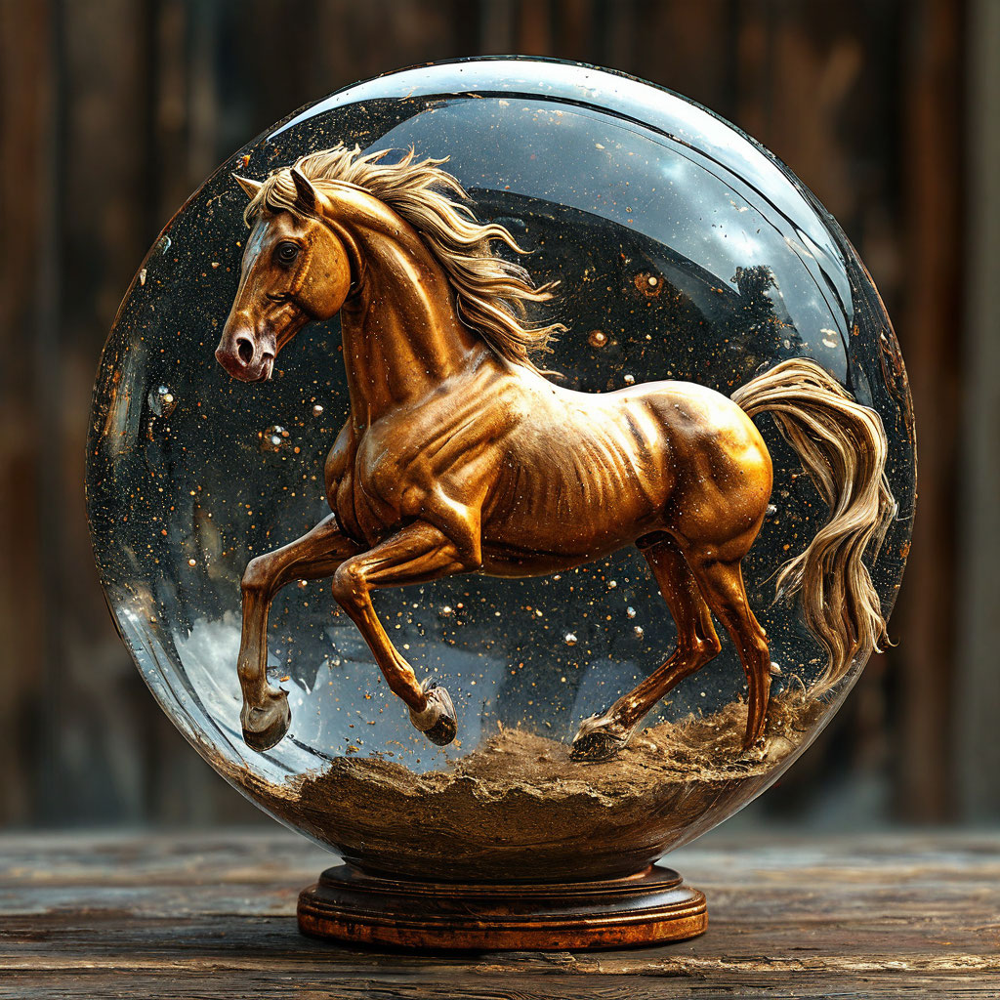

In [9]:
import io
from PIL import Image
from yandex_cloud_ml_sdk import YCloudML

sdk = YCloudML(folder_id=folder_id, auth=api_key)
yart_model = sdk.models.image_generation('yandex-art')

def generate(prompt):
    res = yart_model.run_deferred(prompt)
    res = res.wait()
    return Image.open(io.BytesIO(res.image_bytes))

generate("Сферический конь в вакууме")

Используем возможности программирования, чтобы нарисовать сразу много изображений по алгоритму:

In [10]:
from shwars.utils import display_images
from tqdm.auto import tqdm

res = []
for c in tqdm(["красным","оранжевым","жёлтым","зелёным","голубым","синим","фиолетовым"]):
    res.append(generate(f"Портрет девушки с {c} цветом волос, с интересом смотрящей в камеру"))

Matplotlib is building the font cache; this may take a moment.


  0%|          | 0/7 [00:00<?, ?it/s]

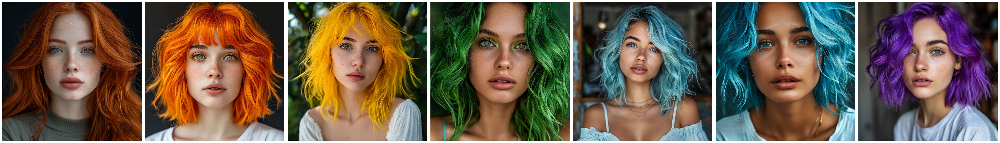

In [11]:
display_images(res)

### Другие сервисы Yandex Cloud

Для работы с другими сервисами Yandex Cloud надо использовать специальные протоколы общения - REST. Ниже пара функций, которые помогут нам в дальнейшем вызывать разные функции в облаке. Не переживайте, если вы совсем не понимаете, что тут написано.

In [12]:
import requests
import os

def call_api(url, data):
    headers = { "Authorization" : f"Api-Key {api_key}" }
    return requests.post(url, json=data, headers=headers).json()

def call_api_get(url, data):
    headers = { "Authorization" : f"Api-Key {api_key}" }
    return requests.get(url, headers=headers).json()

### Распознаём текст на картинке

Для распознавания текста на картике служит сервис Yandex Vision OCR. Рассмотрим следующую картинку:

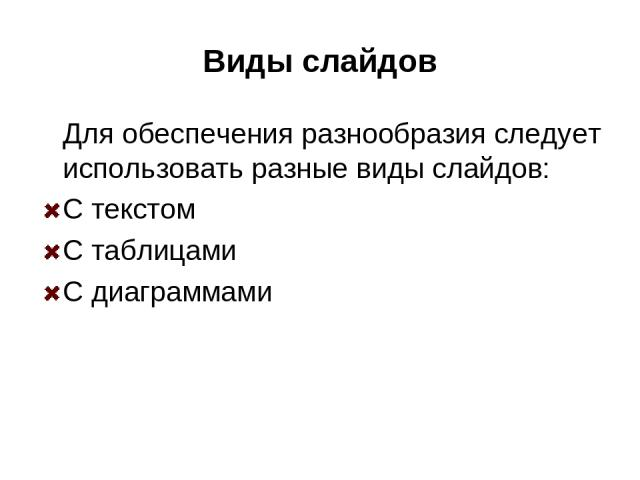

In [13]:
from PIL import Image

img = Image.open('slide.jpg')
img

Здесь для работы с картинками мы используем специальную библиотеку Python - PIL. Объект `Image` представляет собой картинку, которую можно считывать и записывать из файла, показывать и т.д.

Функция `ocr` ниже берёт такую картинку и возвращает результат распознавания текстовых объектов на ней:

In [14]:
from io import BytesIO
import base64

def ocr(img):
    buffer = BytesIO()
    img.save(buffer,format="JPEG")
    myimage = buffer.getvalue()

    j = {
      "mimeType": "JPEG",
      "languageCodes": ["*"],
      "model": "page",
      "content": base64.b64encode(myimage).decode('utf-8')
    }
    res = call_api("https://ocr.api.cloud.yandex.net/ocr/v1/recognizeText",j)
    return res

ocr(img)

{'result': {'textAnnotation': {'width': '640',
   'height': '480',
   'blocks': [{'boundingBox': {'vertices': [{'x': '195', 'y': '53'},
       {'x': '195', 'y': '71'},
       {'x': '446', 'y': '71'},
       {'x': '446', 'y': '53'}]},
     'lines': [{'boundingBox': {'vertices': [{'x': '195', 'y': '53'},
         {'x': '195', 'y': '71'},
         {'x': '446', 'y': '71'},
         {'x': '446', 'y': '53'}]},
       'text': 'Виды слайдов',
       'words': [{'boundingBox': {'vertices': [{'x': '195', 'y': '51'},
           {'x': '195', 'y': '75'},
           {'x': '294', 'y': '75'},
           {'x': '294', 'y': '51'}]},
         'text': 'Виды',
         'entityIndex': '-1',
         'textSegments': [{'startIndex': '0', 'length': '4'}]},
        {'boundingBox': {'vertices': [{'x': '301', 'y': '51'},
           {'x': '301', 'y': '75'},
           {'x': '446', 'y': '75'},
           {'x': '446', 'y': '51'}]},
         'text': 'слайдов',
         'entityIndex': '-1',
         'textSegments': [{'s

Чтобы получить только текст, используем такой вариант:

In [15]:
def ocr_text(img):
    res = ocr(img)
    return res['result']['textAnnotation']['fullText']

txt = ocr_text(img)
print(txt)

Виды слайдов
Для обеспечения разнообразия следует
использовать разные виды слайдов:
×С текстом
×С таблицами
×С диаграммами



Теперь этот текст можно подать на вход gpt-модели, чтобы получить более красивый ответ, отформатированный в формате Markdown:

In [16]:
prompt = """Ты - научный редактор. Тебе на вход подаётся текст в тройных обратных кавычках, распознанный 
со слайдов презентации. Пожалуйста, приведи этот текст в аккуратный вид и представь его в формате Markdown.
Текст: ```{}```
"""

res = gpt(prompt.format(txt))
print(res)

```markdown
## Виды слайдов

Для обеспечения разнообразия следует использовать разные виды слайдов:

- С текстом  
- С таблицами  
- С диаграммами
```


### Синтез речи

Для синтеза речи будем использовать специальную библиотеку *Yandex SpeechKit*. Мы опишем функцию, которой можно передать на вход текст, а на выходе получить речь:

In [17]:
from speechkit import model_repository, configure_credentials, creds

# Аутентификация через API-ключ.
configure_credentials(
   yandex_credentials=creds.YandexCredentials(
      api_key=api_key
   )
)

def synthesize(text,voice='jane'):
   model = model_repository.synthesis_model()

   # Задайте настройки синтеза.
   model.voice = voice

   # Синтез речи и создание аудио с результатом.
   result = model.synthesize(text, raw_format=False)
   return result

res = synthesize('Привет, как ты?')
res

Можем скомбинировать синтез с gpt, и получится синтезатор анекдотов:

In [18]:
res = gpt("Расскажи анекдот про Вовочку")
res = synthesize(res)
res

С фрагментами речи можно выполнять операцию сложения, чтобы смонтировать целую передачу из анекдотов. Также мы используем разные голоса, чтобы было интереснее слушать.

In [19]:
topics = ['Вовочку','Русского и литовца','Математику']
anecdote_radio = None
for x in topics:
    print(f"Генерирую анекдот про {x}")
    f = synthesize(f'Анекдот про {x}',voice='julia')
    if anecdote_radio:
        anecdote_radio +=f
    else:
        anecdote_radio = f
    p = f"Расскажи анекдот про {x}. На выходе выведи только сам анекдот, без лишнего текста"
    f = synthesize(gpt(p),voice='zahar')
    anecdote_radio += f
    
anecdote_radio

Генерирую анекдот про Вовочку
Генерирую анекдот про Русского и литовца
Генерирую анекдот про Математику


### Распознавание речи

SpeechKit может решать обратную задачу - распознавание речи. Для этого опишем функцию `reco`, и передадим туда сгенерированную нами на прошлом шаге "передачу анекдотов".

In [20]:
from speechkit.stt import AudioProcessingType

def reco(bin):
    model = model_repository.recognition_model()
    model.model = 'general'
    model.language = 'ru-RU'
    model.audio_processing_type = AudioProcessingType.Full
    result = model.transcribe(bin)
    # можно использовать transcribe_file для распознавания файла с речью
    return ' '.join(x.normalized_text for x in result)

reco(anecdote_radio)

'Анекдот про Вовочку Вовочка приходит в школу с синяком под глазом. Учительница спрашивает, Вовочка, кто тебя так папа, за что я ему сказал, что в школе нам рассказали, что? Земля круглая, ну и что, а он сказал, врешь. Земля плоская, я доказывать начал, вот он и дал анекдот про русского и литовца русский и литовец поспорили, кто дольше продержится. В холодной воде русский заходит в прорубь, сидит, улыбается литовец, тоже через час русский выходит. Ну, я, пожалуй, хватит, литовец кричит. Эй, а где шуба, которую ты обещал? Если я выиграю русский, какая шуба, ты что до сих пор там анекдот про математику? Почему математики не ходят в лес, боятся, что их съест производная, она же везде растет?'

## Выводы

В облаке Yandex Cloud содержится много сервисов, которые можно легко использовать как строительные блоки для реализации типовых задач: синтез/распознавание голоса, OCR, обращение к языковым моделям и рисования картинок. Но вы не можете влиять на то, как работают эти сервисы.